## IS-507 Final Project

# Momentum Based Tactical Allocation

## Null Hypothesis: Efficient Market Hypothesis
### The efficient market hypothesis (EMH), alternatively known as the efficient market theory, is a hypothesis that states that share prices reflect all available information and consistent profit generation is impossible. According to the EMH, stocks always trade at their fair value on exchanges, making it impossible for investors to purchase undervalued stocks or sell stocks for inflated prices.

## Tactical asset allocation (TAA) is a short-term dynamic allocation strategy that allows us to shift the portfolio between assets depending on the market conditions. Depending on market conditions and the makeup of our portfolio we may prefer certain holdings in our portfolio more than others. Thus, we can use this strategy to capture strong market trends for short-term profit.

## Momentum is the rate of acceleration of a security's price. Momentum trading is a strategy that seeks to capitalize on momentum to enter a trend as it is picking up steam.


In [1]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf

In [2]:
stocks = pd.read_csv('all_stocks_5yr.csv')
stocks

,date,open,high,low,close,volume,Name
0,2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL
1,2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL
2,2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL
3,2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL
4,2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL
...,...,...,...,...,...,...,...
619035,2018-02-01,76.84,78.27,76.69,77.82,2982259,ZTS
619036,2018-02-02,77.53,78.12,76.73,76.78,2595187,ZTS
619037,2018-02-05,76.64,76.92,73.18,73.83,2962031,ZTS
619038,2018-02-06,72.74,74.56,72.13,73.27,4924323,ZTS


In [3]:
stocks.tail()

,date,open,high,low,close,volume,Name
619035,2018-02-01,76.84,78.27,76.69,77.82,2982259,ZTS
619036,2018-02-02,77.53,78.12,76.73,76.78,2595187,ZTS
619037,2018-02-05,76.64,76.92,73.18,73.83,2962031,ZTS
619038,2018-02-06,72.74,74.56,72.13,73.27,4924323,ZTS
619039,2018-02-07,72.70,75.00,72.69,73.86,4534912,ZTS


In [4]:
print('No. of unique stocks are: {}'.format(stocks['Name'].nunique()))

No. of unique stocks are: 505


In [5]:
stocks.shape

(619040, 7)

In [6]:
stocks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 619040 entries, 0 to 619039
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   date    619040 non-null  object 
 1   open    619029 non-null  float64
 2   high    619032 non-null  float64
 3   low     619032 non-null  float64
 4   close   619040 non-null  float64
 5   volume  619040 non-null  int64  
 6   Name    619040 non-null  object 
dtypes: float64(4), int64(1), object(2)
memory usage: 33.1+ MB


In [7]:
stocks.describe()

,open,high,low,close,volume
count,619029.000000,619032.000000,619032.000000,619040.000000,6.190400e+05
mean,83.023334,83.778311,82.256096,83.043763,4.321823e+06
std,97.378769,98.207519,96.507421,97.389748,8.693610e+06
min,1.620000,1.690000,1.500000,1.590000,0.000000e+00
25%,40.220000,40.620000,39.830000,40.245000,1.070320e+06
50%,62.590000,63.150000,62.020000,62.620000,2.082094e+06
75%,94.370000,95.180000,93.540000,94.410000,4.284509e+06
max,2044.000000,2067.990000,2035.110000,2049.000000,6.182376e+08


## Extract all different stock tickers

In [8]:
tickers = list(stocks['Name'].unique())
tickers

['AAL',
 'AAPL',
 'AAP',
 'ABBV',
 'ABC',
 'ABT',
 'ACN',
 'ADBE',
 'ADI',
 'ADM',
 'ADP',
 'ADSK',
 'ADS',
 'AEE',
 'AEP',
 'AES',
 'AET',
 'AFL',
 'AGN',
 'AIG',
 'AIV',
 'AIZ',
 'AJG',
 'AKAM',
 'ALB',
 'ALGN',
 'ALK',
 'ALLE',
 'ALL',
 'ALXN',
 'AMAT',
 'AMD',
 'AME',
 'AMGN',
 'AMG',
 'AMP',
 'AMT',
 'AMZN',
 'ANDV',
 'ANSS',
 'ANTM',
 'AON',
 'AOS',
 'APA',
 'APC',
 'APD',
 'APH',
 'APTV',
 'ARE',
 'ARNC',
 'ATVI',
 'AVB',
 'AVGO',
 'AVY',
 'AWK',
 'AXP',
 'AYI',
 'AZO',
 'A',
 'BAC',
 'BAX',
 'BA',
 'BBT',
 'BBY',
 'BDX',
 'BEN',
 'BF.B',
 'BHF',
 'BHGE',
 'BIIB',
 'BK',
 'BLK',
 'BLL',
 'BMY',
 'BRK.B',
 'BSX',
 'BWA',
 'BXP',
 'CAG',
 'CAH',
 'CAT',
 'CA',
 'CBG',
 'CBOE',
 'CBS',
 'CB',
 'CCI',
 'CCL',
 'CDNS',
 'CELG',
 'CERN',
 'CFG',
 'CF',
 'CHD',
 'CHK',
 'CHRW',
 'CHTR',
 'CINF',
 'CI',
 'CLX',
 'CL',
 'CMA',
 'CMCSA',
 'CME',
 'CMG',
 'CMI',
 'CMS',
 'CNC',
 'CNP',
 'COF',
 'COG',
 'COL',
 'COO',
 'COP',
 'COST',
 'COTY',
 'CPB',
 'CRM',
 'CSCO',
 'CSRA',
 'CSX',
 'CTA

In [9]:
momentum = {'Name': [], 'OneDay': [], 'TwoWeeks': [], 'OneMonth': []}
periods = [1, 14, 30]
for t in tickers:
    stock_data = stocks[stocks['Name'] == t].copy()
    stock_data['OneDay'] = stock_data['close'].pct_change(periods=periods[0])
    stock_data['TwoWeeks'] = stock_data['close'].pct_change(periods=periods[1])
    stock_data['OneMonth'] = stock_data['close'].pct_change(periods=periods[2])
    momentum['Name'].append(str(t))
    momentum['OneDay'].append(stock_data['OneDay'].mean())
    momentum['TwoWeeks'].append(stock_data['TwoWeeks'].mean())
    momentum['OneMonth'].append(stock_data['OneMonth'].mean())
    print(momentum)

{'Name': ['AAL'], 'OneDay': [0.0012453612187455676], 'TwoWeeks': [0.01919295533743129], 'OneMonth': [0.039920823514858615]}
{'Name': ['AAL', 'AAPL'], 'OneDay': [0.0012453612187455676, 0.0007861966919191563], 'TwoWeeks': [0.01919295533743129, 0.012179534421189941], 'OneMonth': [0.039920823514858615, 0.027373731112463773]}
{'Name': ['AAL', 'AAPL', 'AAP'], 'OneDay': [0.0012453612187455676, 0.0007861966919191563, 0.0004434449713894306], 'TwoWeeks': [0.01919295533743129, 0.012179534421189941, 0.006816396705765288], 'OneMonth': [0.039920823514858615, 0.027373731112463773, 0.01389925501497117]}
{'Name': ['AAL', 'AAPL', 'AAP', 'ABBV'], 'OneDay': [0.0012453612187455676, 0.0007861966919191563, 0.0004434449713894306, 0.001050223858667442], 'TwoWeeks': [0.01919295533743129, 0.012179534421189941, 0.006816396705765288, 0.01404352364959079], 'OneMonth': [0.039920823514858615, 0.027373731112463773, 0.01389925501497117, 0.02865841317897778]}
{'Name': ['AAL', 'AAPL', 'AAP', 'ABBV', 'ABC'], 'OneDay': [0.

In [10]:
mdf = pd.DataFrame(momentum)
mdf

,Name,OneDay,TwoWeeks,OneMonth
0,AAL,0.001245,0.019193,0.039921
1,AAPL,0.000786,0.012180,0.027374
2,AAP,0.000443,0.006816,0.013899
3,ABBV,0.001050,0.014044,0.028658
4,ABC,0.000652,0.010070,0.021073
...,...,...,...,...
500,XYL,0.000868,0.012181,0.025192
501,YUM,0.000310,0.004608,0.008854
502,ZBH,0.000456,0.006928,0.014797
503,ZION,0.000775,0.010850,0.022612


In [11]:
mdf.sort_values('OneDay', ascending=False)

,Name,OneDay,TwoWeeks,OneMonth
346,NVDA,0.002563,0.036779,0.079470
334,NFLX,0.002217,0.031351,0.064865
31,AMD,0.001882,0.026918,0.057748
25,ALGN,0.001775,0.026496,0.056100
153,EA,0.001754,0.024344,0.051102
...,...,...,...,...
403,RRC,-0.000978,-0.013065,-0.028741
67,BHF,-0.001053,-0.004154,0.005004
172,EVHC,-0.001887,-0.024961,-0.056645
455,UA,-0.002223,-0.031121,-0.062657


In [12]:
mdf.sort_values('OneMonth', ascending=False)

,Name,OneDay,TwoWeeks,OneMonth
47,APTV,0.001358,0.046920,0.101591
346,NVDA,0.002563,0.036779,0.079470
334,NFLX,0.002217,0.031351,0.064865
31,AMD,0.001882,0.026918,0.057748
25,ALGN,0.001775,0.026496,0.056100
...,...,...,...,...
298,MAT,-0.000484,-0.007361,-0.018483
136,DISCA,-0.000574,-0.007640,-0.019230
403,RRC,-0.000978,-0.013065,-0.028741
172,EVHC,-0.001887,-0.024961,-0.056645


In [13]:
mdf.sort_values('TwoWeeks', ascending=False)

,Name,OneDay,TwoWeeks,OneMonth
47,APTV,0.001358,0.046920,0.101591
346,NVDA,0.002563,0.036779,0.079470
334,NFLX,0.002217,0.031351,0.064865
31,AMD,0.001882,0.026918,0.057748
25,ALGN,0.001775,0.026496,0.056100
...,...,...,...,...
136,DISCA,-0.000574,-0.007640,-0.019230
68,BHGE,-0.003839,-0.012678,-0.016916
403,RRC,-0.000978,-0.013065,-0.028741
172,EVHC,-0.001887,-0.024961,-0.056645


In [14]:
tickers = list(mdf.sort_values('TwoWeeks', ascending=False)['Name'].iloc[:11,])

In [15]:
tickers

['APTV',
 'NVDA',
 'NFLX',
 'AMD',
 'ALGN',
 'AVGO',
 'EA',
 'FB',
 'MU',
 'INCY',
 'HLT']

In [16]:
tickers.remove('FB')
tickers.append('META')
tickers

['APTV',
 'NVDA',
 'NFLX',
 'AMD',
 'ALGN',
 'AVGO',
 'EA',
 'MU',
 'INCY',
 'HLT',
 'META']

In [17]:
#tickers = ['APTV', 'NVDA', 'NFLX', 'AMD', 'AVGO', 'ALGN', 'EA', 'META', 'MU', 'DXC', 'INCY', 'AAPL', 'AMZN', 'ADBE', 'GOOGL', 'TSLA', 'MSFT', 'BRK-B']

In [18]:
import pandas_datareader.data as pdr
import datetime
yf.pdr_override()
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2023, 10, 31)
df = pdr.get_data_yahoo(tickers, start=start, end=end)
df

[*********************100%%**********************]  11 of 11 completed


Adj Close                                                 \
                  ALGN         AMD       APTV        AVGO          EA   
Date                                                                    
2018-01-02  224.619995   10.980000  84.591972  216.090378  107.484520   
2018-01-03  231.199997   11.550000  85.996773  218.453476  107.779137   
2018-01-04  233.300003   12.120000  87.342628  218.526306  105.265106   
2018-01-05  241.070007   11.880000  89.955719  219.821167  110.371735   
2018-01-08  248.899994   12.280000  90.309372  220.347229  111.186821   
...                ...         ...        ...         ...         ...   
2023-10-24  265.459991  101.669998  90.790001  877.077026  127.483116   
2023-10-25  253.690002   96.059998  89.370003  845.741089  125.545799   
2023-10-26  190.559998   93.669998  89.389999  822.965820  123.468681   
2023-10-27  190.940002   96.430000  86.010002  834.522705  122.460075   
2023-10-30  186.740005   96.180000  86.389999  837.399475  121.141907   

                                                                       ...  \
                   HLT        INCY        META         MU        NFLX  ...   
Date                                                                   ...   
2018-01-02   77.858315  100.889999  181.419998  42.988422  201.070007  ...   
2018-01-03   79.001549  100.980003  184.669998  44.277977  205.050003  ...   
2018-01-04   78.415276   98.440002  184.330002  46.148323  205.630005  ...   
2018-01-05   77.477226   99.849998  186.850006  45.085175  209.990005  ...   
2018-01-08   79.089508  100.809998  188.279999  44.839081  212.050003  ...   
...                ...         ...         ...        ...         ...  ...   
2023-10-24  149.514420   54.950001  312.549988  68.070000  413.730011  ...   
2023-10-25  150.613419   54.250000  299.529999  66.500000  411.250000  ...   
2023-10-26  148.335495   54.270000  288.350006  64.529999  403.540009  ...   
2023-10-27  149.034851   52.540001  296.730011  65.650002  397.869995  ...   
2023-10-30  151.142944   52.160000  302.660004  66.070000  410.079987  ...   

               Volume                                                         \
                  AMD     APTV     AVGO       EA      HLT     INCY      META   
Date                                                                           
2018-01-02   44146300  1469600  3313500  4599100  1701500  1830100  18151900   
2018-01-03  154066700  1542300  3116100  3210600  1425600  1458500  16886600   
2018-01-04  109503000  1708500  1906700  3777900  1548200  1445300  13880900   
2018-01-05   63808900  2271100  2863300  5963000  2273600  1422600  13574500   
2018-01-08   63346000  1791100  2097100  4579100  2483100  1531400  17994700   
...               ...      ...      ...      ...      ...      ...       ...   
2023-10-24   51982900  1217000  1497200  1148600  2077600  1669300  19525500   
2023-10-25   53424500  1534600  2143200  1141200  2635100  1385100  42192500   
2023-10-26   49896400  2305900  2791700  1715800  2151200  1769600  66684100   
2023-10-27   52458700  2189000  1823600  1494200  1702400  1495400  29596300   
2023-10-30   43716600  2989000  2088900  2408400  1347300  3300300  28435100   

                                          
                  MU      NFLX      NVDA  
Date                                      
2018-01-02  37097000  10966900  35561600  
2018-01-03  43376700   8591400  91470400  
2018-01-04  52229500   6029600  58326800  
2018-01-05  47381100   7033200  58012400  
2018-01-08  32217400   5580200  88121600  
...              ...       ...       ...  
2023-10-24   8450700   6459200  40146300  
2023-10-25  11924300   6299600  39837900  
2023-10-26  16697900   6849700  54100100  
2023-10-27   9980300   4997600  41678400  
2023-10-30  10667700   5317100  38802800  

[1467 rows x 66 columns]

In [19]:
df.columns

MultiIndex([('Adj Close', 'ALGN'),
            ('Adj Close',  'AMD'),
            ('Adj Close', 'APTV'),
            ('Adj Close', 'AVGO'),
            ('Adj Close',   'EA'),
            ('Adj Close',  'HLT'),
            ('Adj Close', 'INCY'),
            ('Adj Close', 'META'),
            ('Adj Close',   'MU'),
            ('Adj Close', 'NFLX'),
            ('Adj Close', 'NVDA'),
            (    'Close', 'ALGN'),
            (    'Close',  'AMD'),
            (    'Close', 'APTV'),
            (    'Close', 'AVGO'),
            (    'Close',   'EA'),
            (    'Close',  'HLT'),
            (    'Close', 'INCY'),
            (    'Close', 'META'),
            (    'Close',   'MU'),
            (    'Close', 'NFLX'),
            (    'Close', 'NVDA'),
            (     'High', 'ALGN'),
            (     'High',  'AMD'),
            (     'High', 'APTV'),
            (     'High', 'AVGO'),
            (     'High',   'EA'),
            (     'High',  'HLT'),
            (     'H

In [20]:
df['Close']

,ALGN,AMD,APTV,AVGO,EA,HLT,INCY,META,MU,NFLX,NVDA
Date,,,,,,,,,,,
2018-01-02,224.619995,10.980000,86.110001,267.010010,109.449997,79.680000,100.889999,181.419998,43.669998,201.070007,49.837502
2018-01-03,231.199997,11.550000,87.540001,269.929993,109.750000,80.849998,100.980003,184.669998,44.980000,205.050003,53.117500
2018-01-04,233.300003,12.120000,88.910004,270.019989,107.190002,80.250000,98.440002,184.330002,46.880001,205.630005,53.397499
2018-01-05,241.070007,11.880000,91.570000,271.619995,112.389999,79.290001,99.849998,186.850006,45.799999,209.990005,53.849998
2018-01-08,248.899994,12.280000,91.930000,272.269989,113.220001,80.940002,100.809998,188.279999,45.549999,212.050003,55.500000
...,...,...,...,...,...,...,...,...,...,...,...
2023-10-24,265.459991,101.669998,90.790001,881.109985,127.660004,149.649994,54.950001,312.549988,68.070000,413.730011,436.630005
2023-10-25,253.690002,96.059998,89.370003,849.630005,125.720001,150.750000,54.250000,299.529999,66.500000,411.250000,417.790009
2023-10-26,190.559998,93.669998,89.389999,826.750000,123.639999,148.470001,54.270000,288.350006,64.529999,403.540009,403.260010


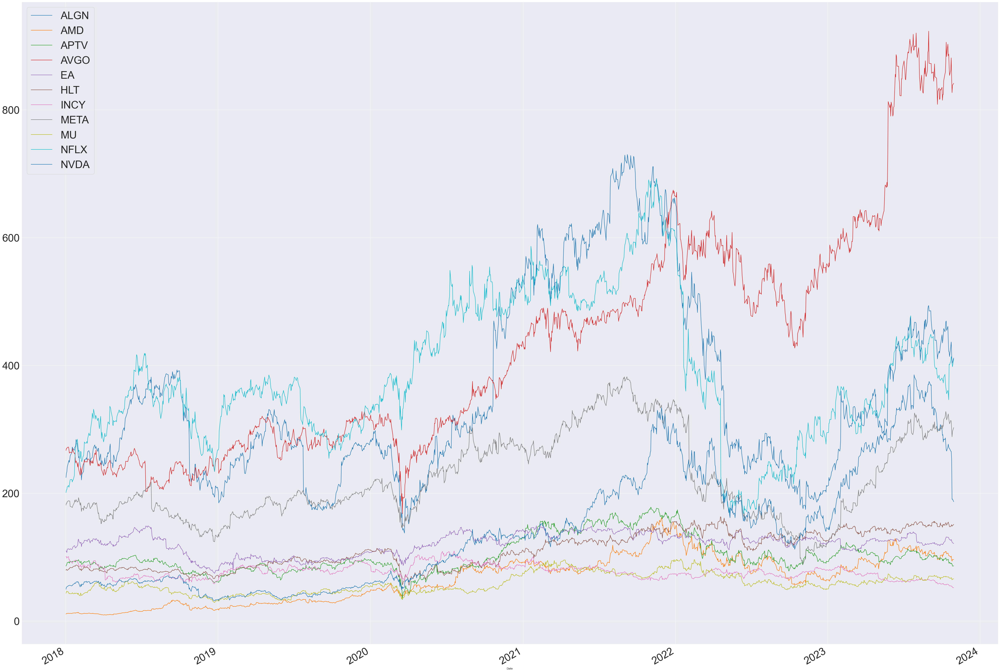

In [21]:
df['Close'].plot(figsize=(60, 45), fontsize=36)
plt.legend(fontsize=36)

In [22]:
df.reset_index(inplace=True)
df

Date   Adj Close                                                 \
                       ALGN         AMD       APTV        AVGO          EA   
0    2018-01-02  224.619995   10.980000  84.591972  216.090378  107.484520   
1    2018-01-03  231.199997   11.550000  85.996773  218.453476  107.779137   
2    2018-01-04  233.300003   12.120000  87.342628  218.526306  105.265106   
3    2018-01-05  241.070007   11.880000  89.955719  219.821167  110.371735   
4    2018-01-08  248.899994   12.280000  90.309372  220.347229  111.186821   
...         ...         ...         ...        ...         ...         ...   
1462 2023-10-24  265.459991  101.669998  90.790001  877.077026  127.483116   
1463 2023-10-25  253.690002   96.059998  89.370003  845.741089  125.545799   
1464 2023-10-26  190.559998   93.669998  89.389999  822.965820  123.468681   
1465 2023-10-27  190.940002   96.430000  86.010002  834.522705  122.460075   
1466 2023-10-30  186.740005   96.180000  86.389999  837.399475  121.141907   

                                                     ...     Volume           \
             HLT        INCY        META         MU  ...        AMD     APTV   
0      77.858315  100.889999  181.419998  42.988422  ...   44146300  1469600   
1      79.001549  100.980003  184.669998  44.277977  ...  154066700  1542300   
2      78.415276   98.440002  184.330002  46.148323  ...  109503000  1708500   
3      77.477226   99.849998  186.850006  45.085175  ...   63808900  2271100   
4      79.089508  100.809998  188.279999  44.839081  ...   63346000  1791100   
...          ...         ...         ...        ...  ...        ...      ...   
1462  149.514420   54.950001  312.549988  68.070000  ...   51982900  1217000   
1463  150.613419   54.250000  299.529999  66.500000  ...   53424500  1534600   
1464  148.335495   54.270000  288.350006  64.529999  ...   49896400  2305900   
1465  149.034851   52.540001  296.730011  65.650002  ...   52458700  2189000   
1466  151.142944   52.160000  302.660004  66.070000  ...   43716600  2989000   

                                                                        \
         AVGO       EA      HLT     INCY      META        MU      NFLX   
0     3313500  4599100  1701500  1830100  18151900  37097000  10966900   
1     3116100  3210600  1425600  1458500  16886600  43376700   8591400   
2     1906700  3777900  1548200  1445300  13880900  52229500   6029600   
3     2863300  5963000  2273600  1422600  13574500  47381100   7033200   
4     2097100  4579100  2483100  1531400  17994700  32217400   5580200   
...       ...      ...      ...      ...       ...       ...       ...   
1462  1497200  1148600  2077600  1669300  19525500   8450700   6459200   
1463  2143200  1141200  2635100  1385100  42192500  11924300   6299600   
1464  2791700  1715800  2151200  1769600  66684100  16697900   6849700   
1465  1823600  1494200  1702400  1495400  29596300   9980300   4997600   
1466  2088900  2408400  1347300  3300300  28435100  10667700   5317100   

                
          NVDA  
0     35561600  
1     91470400  
2     58326800  
3     58012400  
4     88121600  
...        ...  
1462  40146300  
1463  39837900  
1464  54100100  
1465  41678400  
1466  38802800  

[1467 rows x 67 columns]

In [23]:
momentum = df['Date'].copy()
momentum = pd.DataFrame(momentum)
momentum

,Date
0,2018-01-02
1,2018-01-03
2,2018-01-04
3,2018-01-05
4,2018-01-08
...,...
1462,2023-10-24
1463,2023-10-25
1464,2023-10-26
1465,2023-10-27


In [24]:
for t in tickers:
    momentum[t] = df['Close'][t].pct_change(periods=14)
    
momentum

,Date,APTV,NVDA,NFLX,AMD,ALGN,AVGO,EA,MU,INCY,HLT,META
0,2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2018-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1462,2023-10-24,-0.058781,-0.008583,0.097718,-0.023061,-0.089956,0.069555,0.057488,-0.000587,-0.055193,-0.008940,0.022809
1463,2023-10-25,-0.049862,-0.065096,0.103760,-0.066563,-0.094546,0.031280,0.040815,-0.036930,-0.077538,0.006140,-0.017258
1464,2023-10-26,-0.078169,-0.118788,0.057744,-0.126539,-0.330523,-0.021899,0.005530,-0.077616,-0.053375,-0.019288,-0.085851
1465,2023-10-27,-0.111834,-0.105427,0.030885,-0.098532,-0.327534,-0.020470,-0.015732,-0.055124,-0.073042,-0.003407,-0.067942


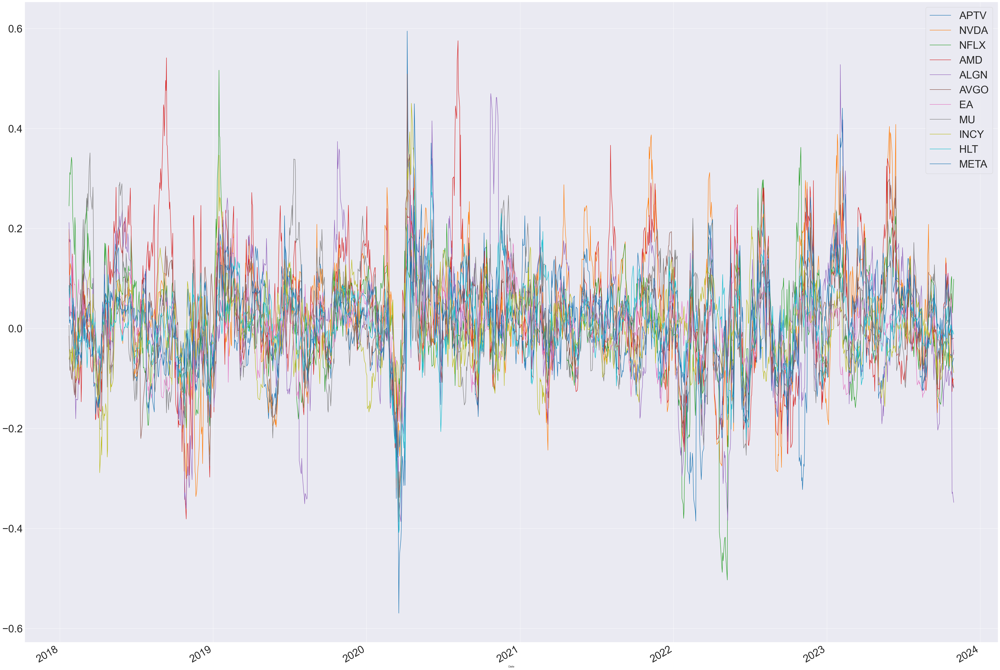

In [25]:
momentum.plot(x='Date', figsize=(60, 45), fontsize=36)
plt.legend(fontsize=36)

In [26]:
momentum

,Date,APTV,NVDA,NFLX,AMD,ALGN,AVGO,EA,MU,INCY,HLT,META
0,2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2018-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1462,2023-10-24,-0.058781,-0.008583,0.097718,-0.023061,-0.089956,0.069555,0.057488,-0.000587,-0.055193,-0.008940,0.022809
1463,2023-10-25,-0.049862,-0.065096,0.103760,-0.066563,-0.094546,0.031280,0.040815,-0.036930,-0.077538,0.006140,-0.017258
1464,2023-10-26,-0.078169,-0.118788,0.057744,-0.126539,-0.330523,-0.021899,0.005530,-0.077616,-0.053375,-0.019288,-0.085851
1465,2023-10-27,-0.111834,-0.105427,0.030885,-0.098532,-0.327534,-0.020470,-0.015732,-0.055124,-0.073042,-0.003407,-0.067942


In [27]:
gap = 14
portfolio = {}
for t in tickers:
    portfolio[t] = []
    
print(portfolio)

{'APTV': [], 'NVDA': [], 'NFLX': [], 'AMD': [], 'ALGN': [], 'AVGO': [], 'EA': [], 'MU': [], 'INCY': [], 'HLT': [], 'META': []}


In [28]:
dict(momentum.iloc[14, :])

{'Date': Timestamp('2018-01-23 00:00:00'),
 'APTV': 0.078039730264446,
 'NVDA': 0.19844492775210454,
 'NFLX': 0.244790292778716,
 'AMD': 0.17850638614396286,
 'ALGN': 0.21164637867666047,
 'AVGO': -0.015392740791808857,
 'EA': 0.0751027999077083,
 'MU': 0.0064117839646087305,
 'INCY': -0.062047796353468465,
 'HLT': 0.08596885602265925,
 'META': 0.04371077066810236}

In [29]:
momentum.shape[0]

1467

In [30]:
for i in range(gap, momentum.shape[0]):
    data = dict(momentum.iloc[i, 1:])
    selected_tickers = []
    selected_momentum = []
    allocated_weights = []
    for k, v in data.items():
        selected_tickers.append(k)
        if v > 0.05:
            selected_momentum.append(v)
        else:
            selected_momentum.append(0)

    total_positive_momentum = sum(selected_momentum)
    if total_positive_momentum == 0:
        continue

    for m in selected_momentum:
        allocated_weights.append(m/total_positive_momentum)
        
    for t in range(len(allocated_weights)):
        portfolio[selected_tickers[t]].append(allocated_weights[t])
        
portfolio

{'APTV': [0.07276435990068093,
  0.08655336637081595,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  1.0,
  0.0,
  0.09373838688432205,
  0.0,
  0.15854172821617837,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.2928136243318674,
  0.25617646273866274,
  0.2713590788356951,
  0.20953610092924058,
  0.16028958421424924,
  0.13931119106525416,
  0.1252525208115686,
  0.0879106846758402,
  0.09813537617962666,
  0.14487755358803034,
  0.15661670483865442,
  0.13320301520917283,
  0.14417703304365032,
  0.08295669612691844,
  0.05917849240907762,
  0.050098792398176044,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.051316720867558945,
  0.057153989240324006,
  0.07182254789962532,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  

In [31]:
initial_investment = 10000
value_out = initial_investment
value_in = 0
last_move_day = 0
stock_position = [0]*len(tickers)
position = {}
stock_price = {}

In [32]:
for t in tickers:
    stock_price[t] = df.Close[t]
    position[t] = 0

In [34]:
values = []
init_holdings = {}
current_holdings = {}

for i in range(gap, len(portfolio['NVDA'])):
    for t in tickers:
        init_holdings[t] = value_in * position[t]
        current_holdings[t] = 0   
    
    if i > gap:
        for t in tickers:
            current_holdings[t] = init_holdings[t] * stock_price[t][i-gap] / stock_price[t][i-gap-1]
            
    for t in tickers:
        position[t] = portfolio[t][i-gap]

    current_holding_sum = 0
    initial_holding_sum = 0
    sum_positions = 0
    
    for t in tickers:
        current_holding_sum += current_holdings[t]
        initial_holding_sum += init_holdings[t]
        sum_positions += position[t]
    
    total_val = value_out + value_in + current_holding_sum - initial_holding_sum

    value_out = total_val * (1 - sum_positions)
    value_in = total_val * sum_positions
    
    values.append(value_in + value_out)

print((value_in + value_out -  initial_investment)*100/initial_investment, "percent gain!")

209.90868614797256 percent gain!


In [35]:
values

[10000.0,
 10336.93908409963,
 10448.473115793724,
 10669.413568731097,
 10906.241588024344,
 10823.62762495729,
 10913.197516425342,
 11055.21552290056,
 11143.721794724528,
 11109.820191287146,
 11027.368580784581,
 11189.392595410494,
 11216.29330030588,
 11578.535662181383,
 12733.946699332433,
 12408.212780646541,
 12390.897592946161,
 12466.649475051347,
 12731.782713686682,
 12523.025922931047,
 12807.390446275364,
 12496.542203181896,
 12227.195895548206,
 11603.093670901557,
 12241.42373969374,
 11952.189465780892,
 11326.20230021793,
 11432.132286636097,
 11848.42868326198,
 11927.112977463321,
 12218.97205311907,
 12364.750320650448,
 12441.928302548655,
 12547.211389805827,
 12511.97483544844,
 12419.112091402985,
 12986.424359388555,
 13383.028133413784,
 13394.603782793994,
 13458.019851595174,
 12933.431879065021,
 13192.554306240272,
 13407.025904486785,
 13701.826124099367,
 13675.61592611246,
 13528.26568345226,
 14040.675736680849,
 13939.513909588259,
 13894.6923622

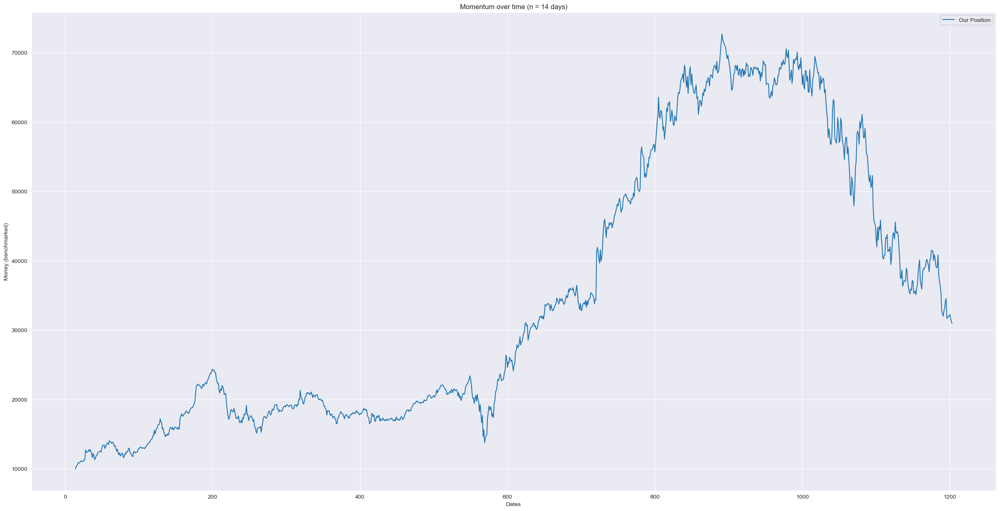

In [36]:
days = range(gap, len(portfolio['NVDA']))
plt.figure(figsize=(30, 15))
plt.plot(days, values, label="Our Position")
plt.xlabel("Dates")
plt.ylabel("Money (benchmarked)")
plt.title("Momentum over time (n = 14 days)")
plt.legend()
plt.show()

In [37]:
df

Date   Adj Close                                                 \
                       ALGN         AMD       APTV        AVGO          EA   
0    2018-01-02  224.619995   10.980000  84.591972  216.090378  107.484520   
1    2018-01-03  231.199997   11.550000  85.996773  218.453476  107.779137   
2    2018-01-04  233.300003   12.120000  87.342628  218.526306  105.265106   
3    2018-01-05  241.070007   11.880000  89.955719  219.821167  110.371735   
4    2018-01-08  248.899994   12.280000  90.309372  220.347229  111.186821   
...         ...         ...         ...        ...         ...         ...   
1462 2023-10-24  265.459991  101.669998  90.790001  877.077026  127.483116   
1463 2023-10-25  253.690002   96.059998  89.370003  845.741089  125.545799   
1464 2023-10-26  190.559998   93.669998  89.389999  822.965820  123.468681   
1465 2023-10-27  190.940002   96.430000  86.010002  834.522705  122.460075   
1466 2023-10-30  186.740005   96.180000  86.389999  837.399475  121.141907   

                                                     ...     Volume           \
             HLT        INCY        META         MU  ...        AMD     APTV   
0      77.858315  100.889999  181.419998  42.988422  ...   44146300  1469600   
1      79.001549  100.980003  184.669998  44.277977  ...  154066700  1542300   
2      78.415276   98.440002  184.330002  46.148323  ...  109503000  1708500   
3      77.477226   99.849998  186.850006  45.085175  ...   63808900  2271100   
4      79.089508  100.809998  188.279999  44.839081  ...   63346000  1791100   
...          ...         ...         ...        ...  ...        ...      ...   
1462  149.514420   54.950001  312.549988  68.070000  ...   51982900  1217000   
1463  150.613419   54.250000  299.529999  66.500000  ...   53424500  1534600   
1464  148.335495   54.270000  288.350006  64.529999  ...   49896400  2305900   
1465  149.034851   52.540001  296.730011  65.650002  ...   52458700  2189000   
1466  151.142944   52.160000  302.660004  66.070000  ...   43716600  2989000   

                                                                        \
         AVGO       EA      HLT     INCY      META        MU      NFLX   
0     3313500  4599100  1701500  1830100  18151900  37097000  10966900   
1     3116100  3210600  1425600  1458500  16886600  43376700   8591400   
2     1906700  3777900  1548200  1445300  13880900  52229500   6029600   
3     2863300  5963000  2273600  1422600  13574500  47381100   7033200   
4     2097100  4579100  2483100  1531400  17994700  32217400   5580200   
...       ...      ...      ...      ...       ...       ...       ...   
1462  1497200  1148600  2077600  1669300  19525500   8450700   6459200   
1463  2143200  1141200  2635100  1385100  42192500  11924300   6299600   
1464  2791700  1715800  2151200  1769600  66684100  16697900   6849700   
1465  1823600  1494200  1702400  1495400  29596300   9980300   4997600   
1466  2088900  2408400  1347300  3300300  28435100  10667700   5317100   

                
          NVDA  
0     35561600  
1     91470400  
2     58326800  
3     58012400  
4     88121600  
...        ...  
1462  40146300  
1463  39837900  
1464  54100100  
1465  41678400  
1466  38802800  

[1467 rows x 67 columns]

In [38]:
df['Close']

,ALGN,AMD,APTV,AVGO,EA,HLT,INCY,META,MU,NFLX,NVDA
0,224.619995,10.980000,86.110001,267.010010,109.449997,79.680000,100.889999,181.419998,43.669998,201.070007,49.837502
1,231.199997,11.550000,87.540001,269.929993,109.750000,80.849998,100.980003,184.669998,44.980000,205.050003,53.117500
2,233.300003,12.120000,88.910004,270.019989,107.190002,80.250000,98.440002,184.330002,46.880001,205.630005,53.397499
3,241.070007,11.880000,91.570000,271.619995,112.389999,79.290001,99.849998,186.850006,45.799999,209.990005,53.849998
4,248.899994,12.280000,91.930000,272.269989,113.220001,80.940002,100.809998,188.279999,45.549999,212.050003,55.500000
...,...,...,...,...,...,...,...,...,...,...,...
1462,265.459991,101.669998,90.790001,881.109985,127.660004,149.649994,54.950001,312.549988,68.070000,413.730011,436.630005
1463,253.690002,96.059998,89.370003,849.630005,125.720001,150.750000,54.250000,299.529999,66.500000,411.250000,417.790009
1464,190.559998,93.669998,89.389999,826.750000,123.639999,148.470001,54.270000,288.350006,64.529999,403.540009,403.260010
1465,190.940002,96.430000,86.010002,838.359985,122.629997,149.169998,52.540001,296.730011,65.650002,397.869995,405.000000


In [39]:
hold_portfolio_dict = {}
len(tickers)

11

In [40]:
budget = initial_investment/len(tickers)
print(budget)
for t in tickers:
    hold_portfolio_dict[t] = budget/df['Close'].loc[0, t]
    
hold_portfolio_dict

909.0909090909091


{'APTV': 10.557320899398814,
 'NVDA': 18.241101204057138,
 'NFLX': 4.521265608873382,
 'AMD': 82.79516821416479,
 'ALGN': 4.047239465999557,
 'AVGO': 3.404707223856092,
 'EA': 8.305993005379518,
 'MU': 20.817287547710123,
 'INCY': 9.010713793147115,
 'HLT': 11.409273413768513,
 'META': 5.0109740837078425}

In [41]:
hold_portfolio = []
for i in range(gap, len(portfolio['NVDA'])):
    total_val = 0
    for t in tickers:
        total_val += df['Close'].loc[i, t]*hold_portfolio_dict[t]
    hold_portfolio.append(total_val)
    
hold_portfolio

[10950.164899121539,
 10894.947581915345,
 10873.834269731558,
 11103.124446655303,
 11121.919618465072,
 10955.954097030348,
 11079.087447446098,
 10956.518723785088,
 10697.633603593627,
 10221.427281003702,
 10547.21007536935,
 10458.912990141904,
 9983.10583243515,
 10192.559791605598,
 10413.742663272602,
 10458.548401445409,
 10739.908044995054,
 10860.162986263851,
 10771.695691329734,
 10847.561962190783,
 10767.505499865983,
 10795.27559754519,
 11022.819257671217,
 11142.147276240796,
 11033.01620535006,
 10915.655746841134,
 10647.668561886387,
 10861.055138727363,
 11044.169872737915,
 11163.981103204414,
 11247.752337130585,
 11267.027697270165,
 11434.4000920663,
 11523.886980949963,
 11441.702261952269,
 11450.046682451248,
 11444.961023995937,
 11434.150280856842,
 11162.141761887699,
 11221.862864035269,
 11258.539323813831,
 10919.771450335542,
 10577.793259896236,
 10926.98567979198,
 10458.388199305662,
 10271.965379372808,
 10481.912139647382,
 10095.098888770151,


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


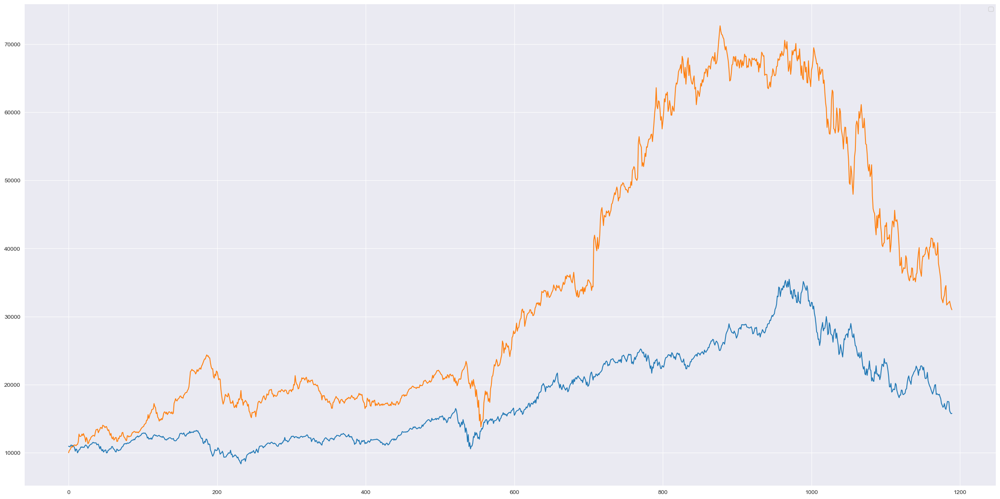

In [42]:
plt.figure(figsize=(30, 15))
plt.plot(hold_portfolio)
plt.plot(values)
plt.legend()

## Hypothesis Testing

### Testing for Normality

(array([153., 402.,  52., 100.,  82.,  55.,  52.,  66., 105., 123.]),
 array([10000.        , 16268.55767297, 22537.11534593, 28805.6730189 ,
        35074.23069187, 41342.78836484, 47611.3460378 , 53879.90371077,
        60148.46138374, 66417.01905671, 72685.57672967]),
 <BarContainer object of 10 artists>)

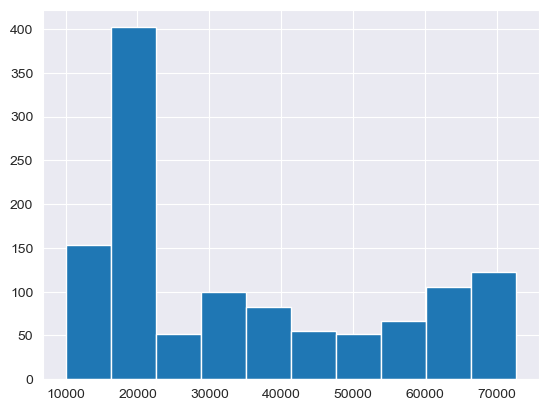

In [43]:
plt.hist(values)

In [44]:
from scipy.stats import shapiro

statistic, p_value = shapiro(values[1:])

print(f"Shapiro-Wilk U statistic: {statistic}")
print(f"P-value: {p_value}")

# Check if the p-value is less than the significance level (e.g., 0.05)
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: The data does not follow a Normal Distribution")
else:
    print("Fail to reject the null hypothesis: The data follows a Normal Distribution")

Shapiro-Wilk U statistic: 0.8571435809135437
P-value: 1.6792046122471004e-31
Reject the null hypothesis: The data does not follow a Normal Distribution


In [45]:
from scipy.stats import mannwhitneyu
print('***** MANN-WHITNEY U TEST *****')
statistic, p_value = mannwhitneyu(values[1:], hold_portfolio[1:], alternative='two-sided')

print(f"Mann-Whitney U statistic: {statistic}")
print(f"P-value: {p_value}")

# Check if the p-value is less than the significance level (e.g., 0.05)
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in the mean profits.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in the mean profits.")

***** MANN-WHITNEY U TEST *****
Mann-Whitney U statistic: 1081754.0
P-value: 4.570224686393607e-111
Reject the null hypothesis: There is a significant difference in the mean profits.


In [46]:
from scipy import stats
print('***** WILCOXON TEST *****')
res = stats.wilcoxon(hold_portfolio[1:], values[1:], alternative='two-sided')

print(f"Wilcoxon statistic: {res.statistic}")
print(f"P-value: {res.pvalue}")

# Check if the p-value is less than the significance level (e.g., 0.05)
alpha = 0.05
if res.pvalue < alpha:
    print("Reject the null hypothesis: There is a significant difference in the mean profits.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in the mean profits.")

***** WILCOXON TEST *****
Wilcoxon statistic: 32.0
P-value: 5.481274512015218e-196
Reject the null hypothesis: There is a significant difference in the mean profits.
